# Segment Anything Model (SAM)
## Интерактивная сегментация одним кликом

### План семинара:
1. Что такое SAM
2. Сегментация по точкам (point prompts)
3. Сегментация по боксам (box prompts)
4. Сегментация всего на изображении (automatic mask generation)
5. Комбинация промптов
6. Практическое применение

SAM: Модель обучена на 11 млн изображений и может сегментировать ЛЮБОЙ объект по простому указанию (клик, бокс, текст)!


In [1]:
# Установка библиотек
!pip install -q segment-anything opencv-python matplotlib numpy torch torchvision
from huggingface_hub import hf_hub_download
hf_hub_download("ybelkada/segment-anything", "checkpoints/sam_vit_b_01ec64.pth", local_dir="")
print("✅ Библиотеки установлены, модель скачана")

checkpoints/sam_vit_b_01ec64.pth:   0%|          | 0.00/375M [00:00<?, ?B/s]

✅ Библиотеки установлены, модель скачана


In [2]:
# Импорт и настройка
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from segment_anything import SamPredictor, sam_model_registry, SamAutomaticMaskGenerator
from pathlib import Path
import requests
from PIL import Image
import io

# Настройка визуализации
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10

print("✅ Готово к работе!")

✅ Готово к работе!


## 1. Загрузка модели и изображения

In [3]:
# Инициализация SAM
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"🖥 Используем: {device}")

# Регистрируем модель (доступные: vit_h, vit_l, vit_b)
sam = sam_model_registry["vit_b"](checkpoint="checkpoints/sam_vit_b_01ec64.pth")
sam.to(device=device)
predictor = SamPredictor(sam)

print(f"✅ SAM загружен на {device}")

🖥 Используем: cuda
✅ SAM загружен на cuda


Размер изображения: (1200, 1800, 3)


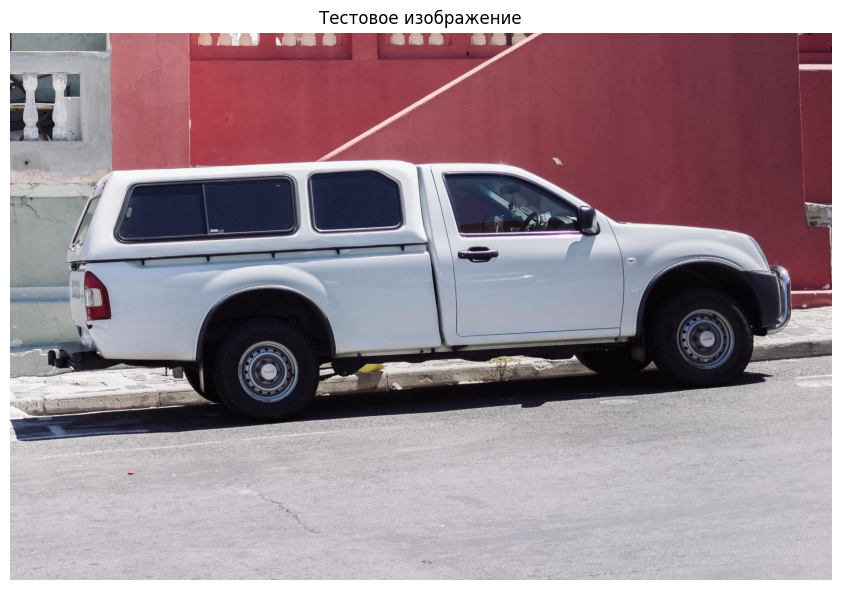

In [4]:
# Загружаем тестовое изображение
# Можно заменить на свое: image = cv2.imread("path/to/image.jpg")

url = "https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg"
response = requests.get(url)
image = np.array(Image.open(io.BytesIO(response.content)))

# Или загрузить свое изображение:
# image = cv2.imread("your_image.jpg")
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

print(f"Размер изображения: {image.shape}")

plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.axis("off")
plt.title("Тестовое изображение")
plt.tight_layout()
plt.show()

In [5]:
# Устанавливаем изображение в predictor (это нужно сделать один раз)
predictor.set_image(image)
print("✅ Изображение установлено в модель")

✅ Изображение установлено в модель


## 2. Сегментация по ТОЧКАМ (Point Prompts)

### Задание 2.1: Сегментация объекта по одной точке

Укажите координаты точки (x, y) внутри объекта, который хотите выделить.

Найдено масок: 3
Scores: [0.9052571  0.95115453 0.98385394]


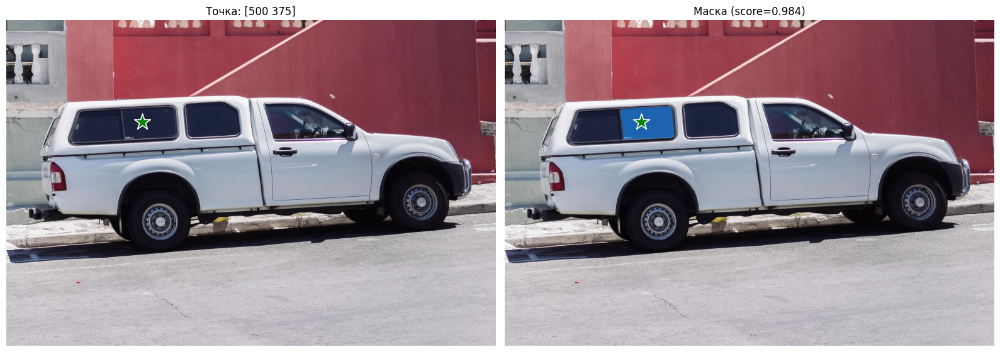

In [6]:
# Задаем точку (координаты x, y)
# Например, для грузовика: колесо, кабина, фара
input_point = np.array([[500, 375]])  # Координаты точки [x, y]
input_label = np.array([1])  # 1 = объект, 0 = фон

# Предсказание
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True  # Вернуть несколько вариантов
)

print(f"Найдено масок: {len(masks)}")
print(f"Scores: {scores}")

# Визуализация лучшей маски
best_mask_idx = np.argmax(scores)

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], c='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], c='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))

ax[0].imshow(image)
show_points(input_point, input_label, ax[0])
ax[0].set_title(f"Точка: {input_point[0]}", fontsize=12)
ax[0].axis("off")

ax[1].imshow(image)
show_mask(masks[best_mask_idx], ax[1])
show_points(input_point, input_label, ax[1])
ax[1].set_title(f"Маска (score={scores[best_mask_idx]:.3f})", fontsize=12)
ax[1].axis("off")

plt.tight_layout()
plt.show()

### 📝 Задание 2.2: Эксперимент с точками

Попробуйте:
1. Сегментировать колесо грузовика (поставьте точку на колесе)
2. Сегментировать кабину (точка на кабине)
3. Сегментировать фару (точка на фаре)
4. Попробуйте указать точку фона (label=0) и посмотрите, что произойдет

Вопросы для размышления:**
- Почему иногда SAM выдает несколько масок для одной точки?
- Как меняется результат в зависимости от расположения точки?

In [ ]:
# 🎮 ВАШ КОД ЗДЕСЬ: Попробуйте разные точки
# Пример: точка на колесе (примерно [400, 450])

# input_point = np.array([[400, 450]])  # Измените координаты!
# input_label = np.array([1])

# masks, scores, logits = predictor.predict(
#     point_coords=input_point,
#     point_labels=input_label,
#     multimask_output=True
# )

# ... визуализация как выше ...

## 3. Сегментация по БОКСАМ (Box Prompts)

### Задание 3.1: Сегментация по bounding box

Задайте прямоугольник [x1, y1, x2, y2] вокруг объекта.

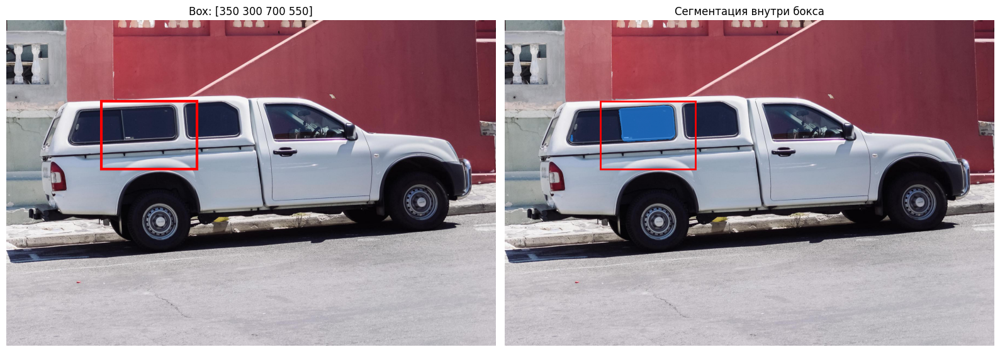

In [7]:
# Задаем bounding box [x1, y1, x2, y2]
input_box = np.array([350, 300, 700, 550])  # Пример: весь грузовик

# Предсказание
masks, scores, logits = predictor.predict(
    box=input_box[None, :],  # Добавляем размерность
    multimask_output=False
)

# Визуализация
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

ax[0].imshow(image)
ax[0].add_patch(plt.Rectangle((input_box[0], input_box[1]),
                               input_box[2]-input_box[0],
                               input_box[3]-input_box[1],
                               fill=False, edgecolor='red', linewidth=3))
ax[0].set_title(f"Box: {input_box}", fontsize=12)
ax[0].axis("off")

ax[1].imshow(image)
show_mask(masks[0], ax[1])
ax[1].add_patch(plt.Rectangle((input_box[0], input_box[1]),
                               input_box[2]-input_box[0],
                               input_box[3]-input_box[1],
                               fill=False, edgecolor='red', linewidth=2))
ax[1].set_title("Сегментация внутри бокса", fontsize=12)
ax[1].axis("off")

plt.tight_layout()
plt.show()

### Задание 3.2: Сегментация нескольких объектов

Попробуйте задать несколько боксов для разных объектов одновременно!

📊 Найдено масок: 2


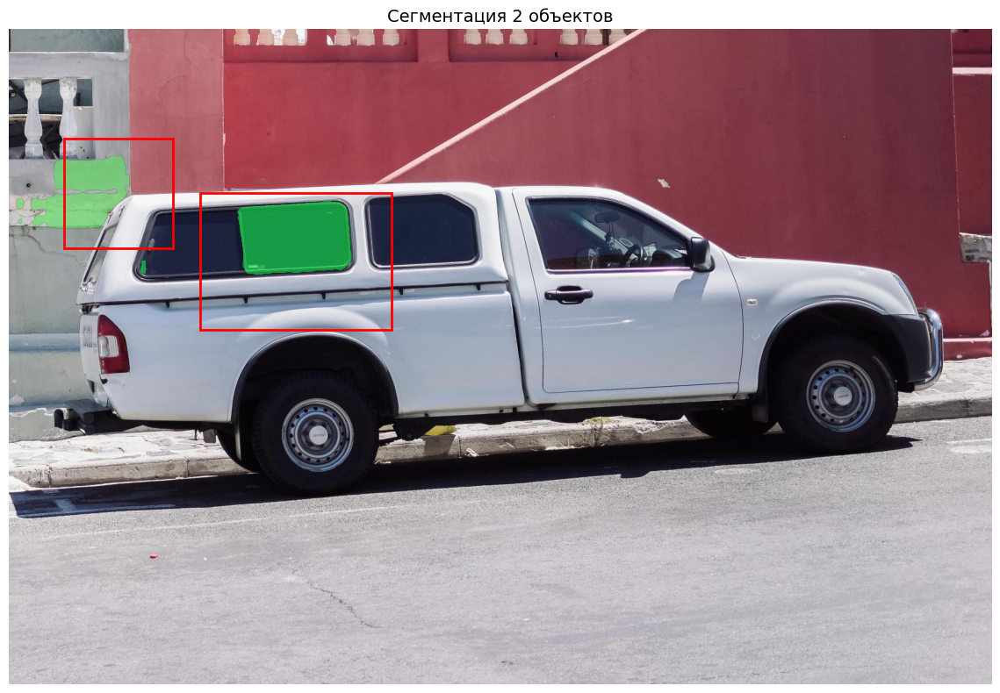

In [8]:
# 📦 Несколько боксов — вызываем predict для каждого отдельно
input_boxes = np.array([
    [350, 300, 700, 550],  # Грузовик
    [100, 200, 300, 400],  # Что-то еще на изображении
], dtype=np.float32)  # Важно: float32!

all_masks = []
all_scores = []

for box in input_boxes:
    masks, scores, logits = predictor.predict(
        box=box[None, :],  # Добавляем измерение батча (1, 4)
        multimask_output=False
    )
    all_masks.append(masks[0])
    all_scores.append(scores[0])

print(f"📊 Найдено масок: {len(all_masks)}")

# Визуализация
plt.figure(figsize=(12, 8))
plt.imshow(image)

for i, (mask, box) in enumerate(zip(all_masks, input_boxes)):
    show_mask(mask, plt.gca(), random_color=True)
    plt.gca().add_patch(plt.Rectangle((box[0], box[1]),
                                       box[2]-box[0], box[3]-box[1],
                                       fill=False, edgecolor='red', linewidth=2))

plt.title(f"Сегментация {len(all_masks)} объектов", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()

## 4. Автоматическая сегментация ВСЕГО (Automatic Mask Generation)

SAM может автоматически найти ВСЕ объекты на изображении без каких-либо промптов!

In [9]:
# Создаем автоматический генератор масок
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,  # Сколько точек генерировать на сторону (больше = точнее, но медленнее)
    pred_iou_thresh=0.86,  # Порог качества масок (0-1)
    stability_score_thresh=0.92,  # Порог стабильности
    crop_n_layers=1,  # Сколько слоев кропа использовать
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,  # Минимальная площадь маски
)

print("✅ Генератор создан")

✅ Генератор создан


In [10]:
# Генерируем все маски (это может занять 10-30 секунд)
print("Генерируем маски...")
masks_auto = mask_generator.generate(image)

print(f"Найдено объектов: {len(masks_auto)}")
print(f"Средняя площадь маски: {np.mean([m['area'] for m in masks_auto]):.0f} пикселей")

Генерируем маски...
Найдено объектов: 83
Средняя площадь маски: 37228 пикселей


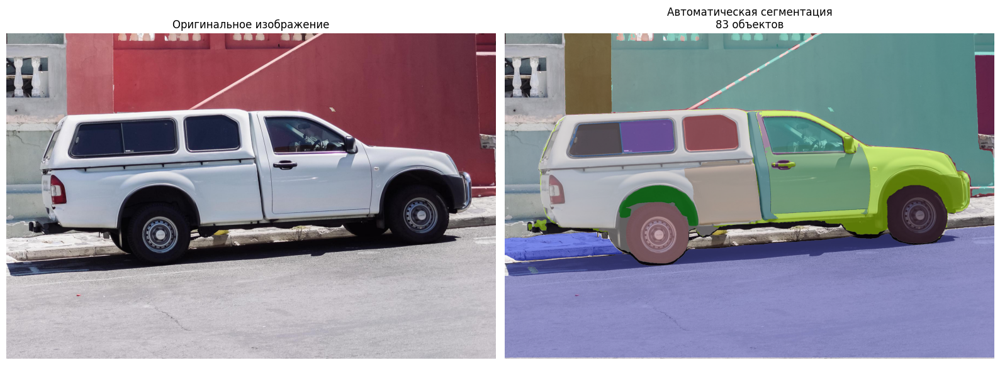

In [11]:
# Визуализация всех масок
def show_anns(anns, ax):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)

    ax.set_autoscale_on(False)
    img = np.ones((sorted_anns[0]['segmentation'].shape[0],
                   sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0

    for ann in sorted_anns[:20]:  # Показываем топ-20 по площади
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask

    ax.imshow(img)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))

ax[0].imshow(image)
ax[0].set_title("Оригинальное изображение", fontsize=12)
ax[0].axis("off")

ax[1].imshow(image)
show_anns(masks_auto, ax[1])
ax[1].set_title(f"Автоматическая сегментация\n{len(masks_auto)} объектов", fontsize=12)
ax[1].axis("off")

plt.tight_layout()
plt.show()

### Задание 4.1: Анализ автоматической сегментации

Попробуйте изменить параметры генератора:
1. `points_per_side=16` (быстрее, но менее точно)
2. `points_per_side=64` (медленнее, но детальнее)
3. `pred_iou_thresh=0.5` (больше масок, но больше шума)
4. `pred_iou_thresh=0.95` (только очень качественные маски)

Сравните количество и качество масок!

## 5. Практическое применение: Интерактивная сегментация

### Задание 5.1: Выделение объекта интереса

Представьте, что вы разрабатываете инструмент для дизайнеров. Пользователь кликает на объект, а SAM его выделяет.

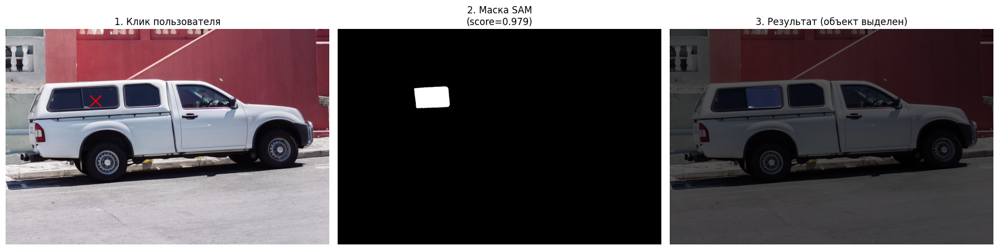

✅ Объект выделен! Площадь: 21535 пикселей


In [12]:
# Сценарий: Пользователь кликает на объект
# Симулируем клик пользователя (задайте координаты)
user_click = np.array([[500, 400]])  # Где кликнул пользователь
user_label = np.array([1])  # 1 = хочу выделить этот объект

# SAM находит объект
masks, scores, logits = predictor.predict(
    point_coords=user_click,
    point_labels=user_label,
    multimask_output=True
)

# Выбираем лучшую маску
best_idx = np.argmax(scores)
best_mask = masks[best_idx]

# Создаем маску для применения фильтров
masked_image = image.copy()
masked_image[~best_mask] = masked_image[~best_mask] // 3  # Затемняем фон

# Визуализация
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

ax[0].imshow(image)
ax[0].scatter(user_click[:, 0], user_click[:, 1], c='red', s=200, marker='x')
ax[0].set_title("1. Клик пользователя", fontsize=12)
ax[0].axis("off")

ax[1].imshow(best_mask, cmap='gray')
ax[1].set_title(f"2. Маска SAM\n(score={scores[best_idx]:.3f})", fontsize=12)
ax[1].axis("off")

ax[2].imshow(masked_image)
ax[2].set_title("3. Результат (объект выделен)", fontsize=12)
ax[2].axis("off")

plt.tight_layout()
plt.show()

print(f"✅ Объект выделен! Площадь: {np.sum(best_mask)} пикселей")

## 6. Сравнение методов

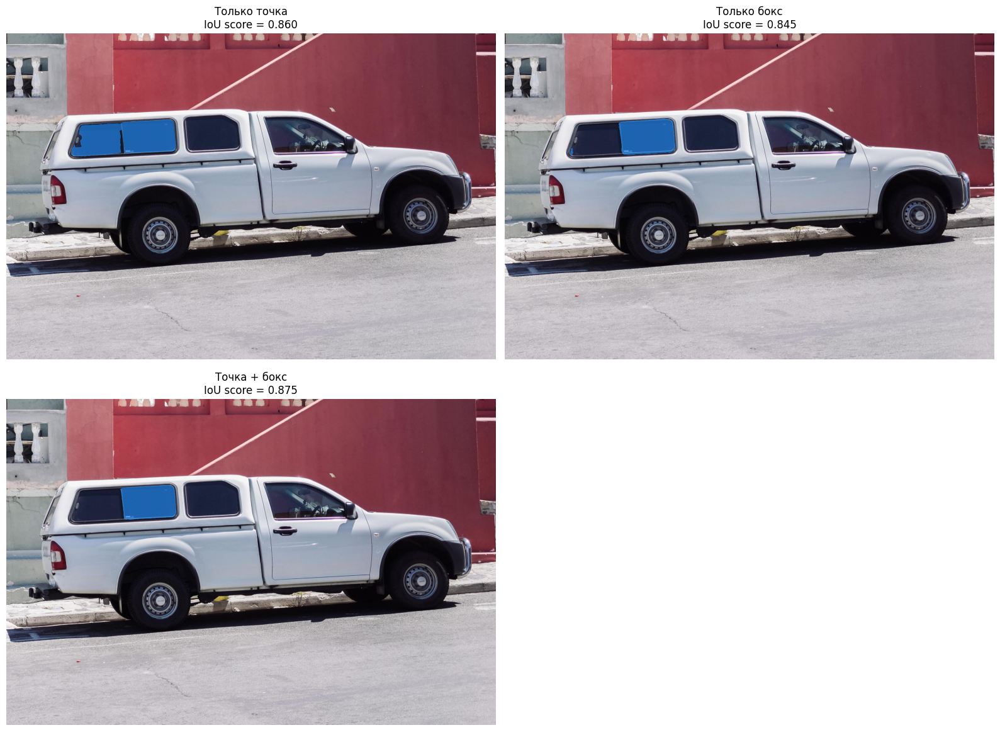

💡 Вывод: Комбинация промптов часто дает лучший результат!


In [13]:
# Сравним три подхода на одном объекте

# 1. Точка
point = np.array([[500, 375]])
masks_point, scores_point, _ = predictor.predict(
    point_coords=point, point_labels=np.array([1]), multimask_output=False
)

# 2. Бокс
box = np.array([350, 300, 700, 550])
masks_box, scores_box, _ = predictor.predict(
    box=box[None, :], multimask_output=False
)

# 3. Точка + бокс вместе!
masks_combined, scores_combined, _ = predictor.predict(
    point_coords=point,
    point_labels=np.array([1]),
    box=box[None, :],
    multimask_output=False
)

# Визуализация сравнения
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

methods = [
    ("Только точка", masks_point[0], scores_point[0]),
    ("Только бокс", masks_box[0], scores_box[0]),
    ("Точка + бокс", masks_combined[0], scores_combined[0]),
]

for idx, (title, mask, score) in enumerate(methods):
    ax = axes[idx // 2, idx % 2]
    ax.imshow(image)
    show_mask(mask, ax)
    ax.set_title(f"{title}\nIoU score = {score:.3f}", fontsize=12)
    ax.axis("off")

# Пустой subplot для красоты
axes[1, 1].axis("off")

plt.tight_layout()
plt.show()

print("💡 Вывод: Комбинация промптов часто дает лучший результат!")

## Домашнее Задание

**Задание 1: Интерактивный инструмент**

Создайте функцию, которая:
1. Принимает изображение и список точек (кликов пользователя)
2. Для каждой точки определяет, к какому объекту она относится
3. Возвращает:
   - Количество уникальных объектов, которые выделил пользователь
   - Общую площадь выделенных объектов
   - Визуализацию с разными цветами для каждого объекта

**Задание 2: Анализ качества**

1. Возьмите 3 разных изображения (природа, город, люди)
2. Для каждого изображения:
   - Запустите автоматическую сегментацию
   - Подсчитайте количество найденных объектов
   - Найдите средний IoU score
   - Сохраните статистику
3. Постройте график: "Тип изображения vs Количество объектов"
4. Сделайте вывод: на каких изображениях SAM работает лучше/хуже?

**Задание 3**

| Трек | Задание |
|------|---------|
| Creative** | Создайте "умное размытие фона": выделите главный объект точкой, размойте все остальное (эффект портретного режима) |
| Analytical | Реализуйте подсчет объектов определенного типа (например, "сколько машин на парковке") используя SAM + простые эвристики |
| Performance | Сравните скорость и качество трех моделей SAM: ViT-B, ViT-L, ViT-H. Постройте график "время vs качество" |


---

### Критерии оценки:
- Код работает без ошибок (20%)
- Правильное использование SAM API (30%)
- Качество визуализаций (20%)
- Глубина анализа и выводов (20%)
- Оформление и комментарии (10%)

### Формат сдачи:
- .ipynb файл с кодом и результатами
- 2-3 абзаца выводов
- Скриншоты результатов

## Полезные советы

### Частые проблемы:
1. CUDA out of memory → Используйте vit_b вместо vit_h, уменьшите `points_per_side`
2. Пустые маски → Проверьте, что точки/боксы внутри изображения
3. Медленная работа → Уменьшите `points_per_side` или используйте CPU для небольших изображений

### Ресурсы:
- [Официальный репозиторий SAM](https://github.com/facebookresearch/segment-anything)
[Demo SAM](https://segment-anything.com/demo) — попробуйте онлайн!
- [Paper SAM](https://arxiv.org/abs/2304.02643) — для тех, кто хочет понять internals
- [SA-1B Dataset](https://segment-anything.com/dataset/index.html) — 1.1 млрд масок!


### Задание 2.2 — эксперименты с точками

Ставим точки на разные части грузовика и одну точку в фон (`label=0`), смотрим, как меняется маска.

Колесо: score=0.825, площадь = 2888 px
Дверь: score=1.004, площадь = 23453 px
Лобовое стекло: score=0.940, площадь = 111250 px
Небо: score=0.735, площадь = 35685 px


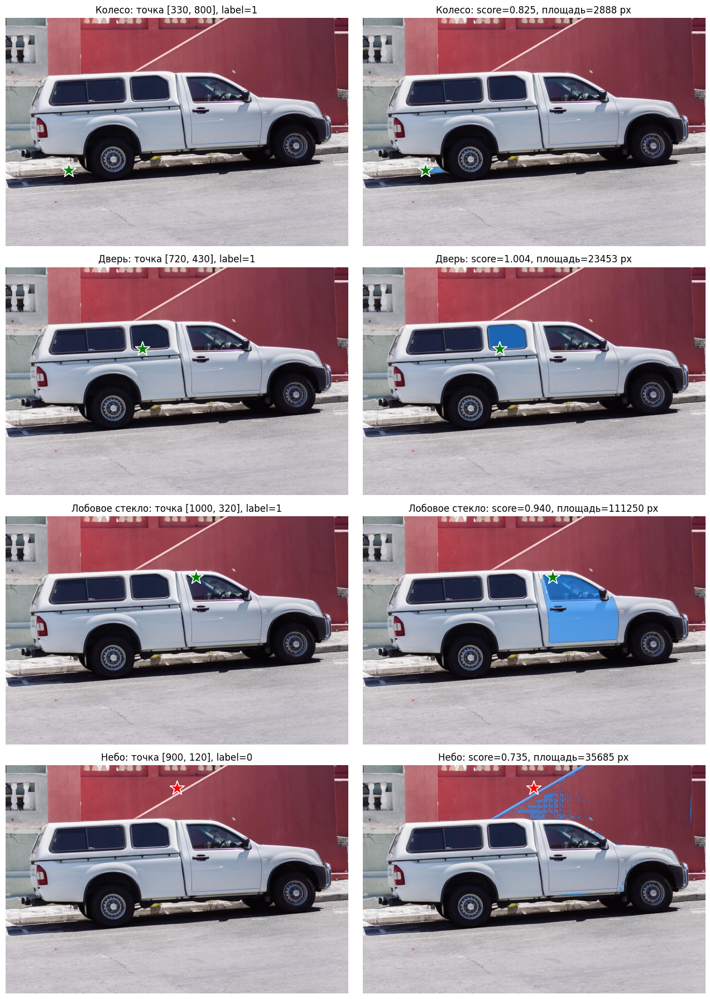

In [14]:
def predict_by_point(img, xy, label=1):
    masks, scores, _ = predictor.predict(
        point_coords=np.array([xy]),
        point_labels=np.array([label]),
        multimask_output=True,
    )
    top = int(np.argmax(scores))
    return masks[top], float(scores[top])

probes = [
    ("Колесо",         [330, 800],  1),
    ("Дверь",          [720, 430],  1),
    ("Лобовое стекло", [1000, 320], 1),
    ("Небо",           [900, 120],  0),
]

predictor.set_image(image)

fig, ax = plt.subplots(len(probes), 2, figsize=(13, 4.5 * len(probes)))
for r, (name, xy, lbl) in enumerate(probes):
    mask, score = predict_by_point(image, xy, lbl)
    pts, labels = np.array([xy]), np.array([lbl])

    ax[r, 0].imshow(image)
    show_points(pts, labels, ax[r, 0])
    ax[r, 0].set_title(f"{name}: точка {xy}, label={lbl}")
    ax[r, 0].axis("off")

    ax[r, 1].imshow(image)
    show_mask(mask, ax[r, 1])
    show_points(pts, labels, ax[r, 1])
    ax[r, 1].set_title(f"{name}: score={score:.3f}, площадь={int(mask.sum())} px")
    ax[r, 1].axis("off")

    print(f"{name}: score={score:.3f}, площадь = {int(mask.sum())} px")

plt.tight_layout()
plt.show()


Одна точка неоднозначна: она может означать и мелкую деталь (колесо), и весь объект (грузовик), поэтому при `multimask_output=True` модель возвращает несколько гипотез разного масштаба, а мы берём ту, у которой выше `score`.

Точка в центре крупной однородной области даёт стабильную и точную маску. Точка у границы или на мелкой детали менее предсказуема — модель может зацепить соседний объект или выделить слишком большую область. Точка с `label=0` трактуется как фон и подавляет выделение в этом месте.

### Задание 4.1 — влияние параметров автоматической сегментации

Меняем `points_per_side` и `pred_iou_thresh` и сравниваем количество масок и их среднее качество.

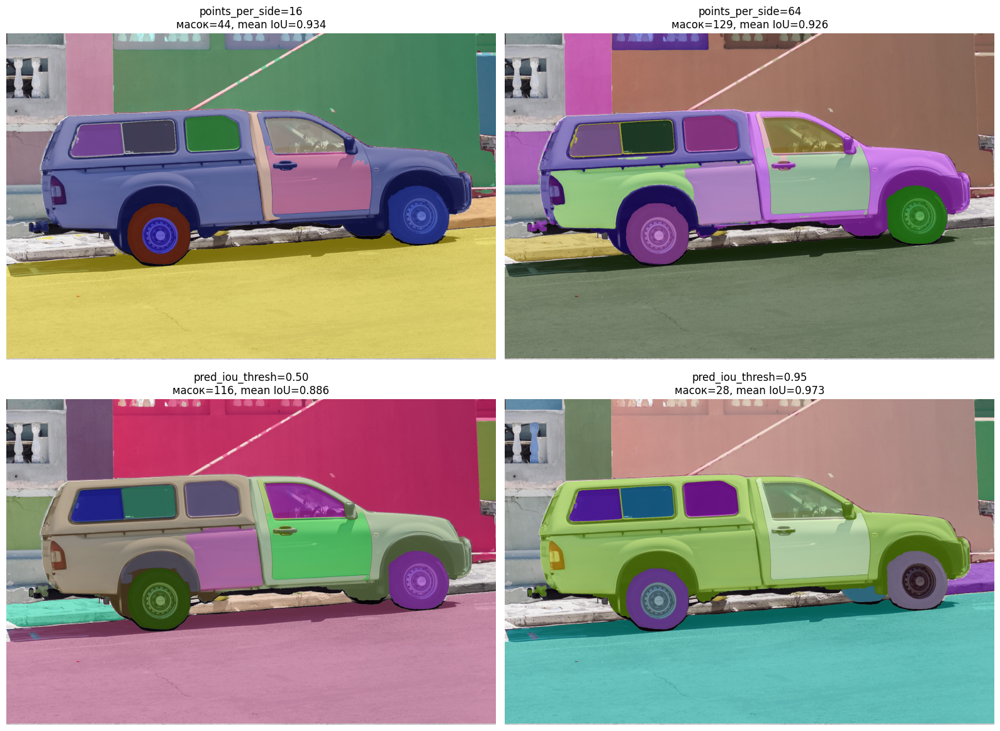

Параметр              | масок | mean IoU | mean area
-------------------------------------------------------
points_per_side=16    |    44 |    0.934 |     59058
points_per_side=64    |   129 |    0.926 |     25903
pred_iou_thresh=0.50  |   116 |    0.886 |     27332
pred_iou_thresh=0.95  |    28 |    0.973 |     84135


In [15]:
param_grid = [
    {"label": "points_per_side=16",   "pps": 16, "iou": 0.86},
    {"label": "points_per_side=64",   "pps": 64, "iou": 0.86},
    {"label": "pred_iou_thresh=0.50", "pps": 32, "iou": 0.50},
    {"label": "pred_iou_thresh=0.95", "pps": 32, "iou": 0.95},
]

stats = []
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.ravel()

for k, cfg in enumerate(param_grid):
    gen = SamAutomaticMaskGenerator(
        model=sam,
        points_per_side=cfg["pps"],
        pred_iou_thresh=cfg["iou"],
        stability_score_thresh=0.92,
        crop_n_layers=1,
        crop_n_points_downscale_factor=2,
        min_mask_region_area=100,
    )
    m = gen.generate(image)
    n = len(m)
    mean_iou = float(np.mean([x["predicted_iou"] for x in m])) if n else 0.0
    mean_area = float(np.mean([x["area"] for x in m])) if n else 0.0
    stats.append((cfg["label"], n, mean_iou, mean_area))

    axes[k].imshow(image)
    show_anns(m, axes[k])
    axes[k].set_title(f"{cfg['label']}\nмасок={n}, mean IoU={mean_iou:.3f}")
    axes[k].axis("off")

plt.tight_layout()
plt.show()

print(f"{'Параметр':22s}| масок | mean IoU | mean area")
print("-" * 55)
for label, n, mean_iou, mean_area in stats:
    print(f"{label:22s}| {n:5d} | {mean_iou:8.3f} | {mean_area:9.0f}")


Чем больше `points_per_side`, тем больше масок и тем мельче выделяемые детали, но обработка дольше, а средний IoU чуть ниже. Чем выше `pred_iou_thresh`, тем меньше масок остаётся, зато среди них почти нет шумных и средний IoU растёт; при низком пороге 0.5 масок много, но появляется мусор. То есть количество и качество масок — это компромисс, который регулируется этими двумя параметрами.

### Задание 1 — интерактивный инструмент выделения объектов

Функция принимает изображение и список кликов, для каждого клика берёт лучшую маску и объединяет в один объект клики, чьи маски почти совпадают по IoU. Возвращает число уникальных объектов, их суммарную площадь и визуализацию.

In [16]:
def iou_score(a, b):
    inter = np.logical_and(a, b).sum()
    union = np.logical_or(a, b).sum()
    return float(inter) / float(union) if union else 0.0


def collect_objects(img, clicks, dup_iou=0.7):
    """clicks: [((x, y), "имя"), ...]; клики с IoU масок > dup_iou считаем одним объектом."""
    predictor.set_image(img)

    objects = []
    assignment = []

    for (x, y), name in clicks:
        masks, scores, _ = predictor.predict(
            point_coords=np.array([[x, y]]),
            point_labels=np.array([1]),
            multimask_output=True,
        )
        mask = masks[int(np.argmax(scores))]

        found = -1
        for idx, obj in enumerate(objects):
            if iou_score(mask, obj["mask"]) > dup_iou:
                found = idx
                break

        if found == -1:
            objects.append({"mask": mask, "points": [(x, y)], "names": [name]})
            assignment.append(len(objects) - 1)
        else:
            objects[found]["points"].append((x, y))
            if name not in objects[found]["names"]:
                objects[found]["names"].append(name)
            assignment.append(found)

    union_mask = np.zeros(img.shape[:2], dtype=bool)
    for obj in objects:
        union_mask |= obj["mask"]
    total_area = int(union_mask.sum())

    palette = plt.cm.tab10(np.linspace(0, 1, max(len(objects), 1)))
    plt.figure(figsize=(12, 8))
    plt.imshow(img)
    for idx, obj in enumerate(objects):
        rgba = np.array([*palette[idx][:3], 0.5])
        h, w = obj["mask"].shape
        plt.imshow(obj["mask"].reshape(h, w, 1) * rgba.reshape(1, 1, 4))
        pts = np.array(obj["points"])
        plt.scatter(pts[:, 0], pts[:, 1], marker="*", s=180,
                    color=palette[idx], edgecolor="white", linewidth=1.2,
                    label=", ".join(obj["names"]))
    plt.title(f"Уникальных объектов: {len(objects)} | общая площадь: {total_area} px")
    plt.legend(loc="upper right")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    return {"num_objects": len(objects), "total_area": total_area,
            "assignment": assignment, "objects": objects}


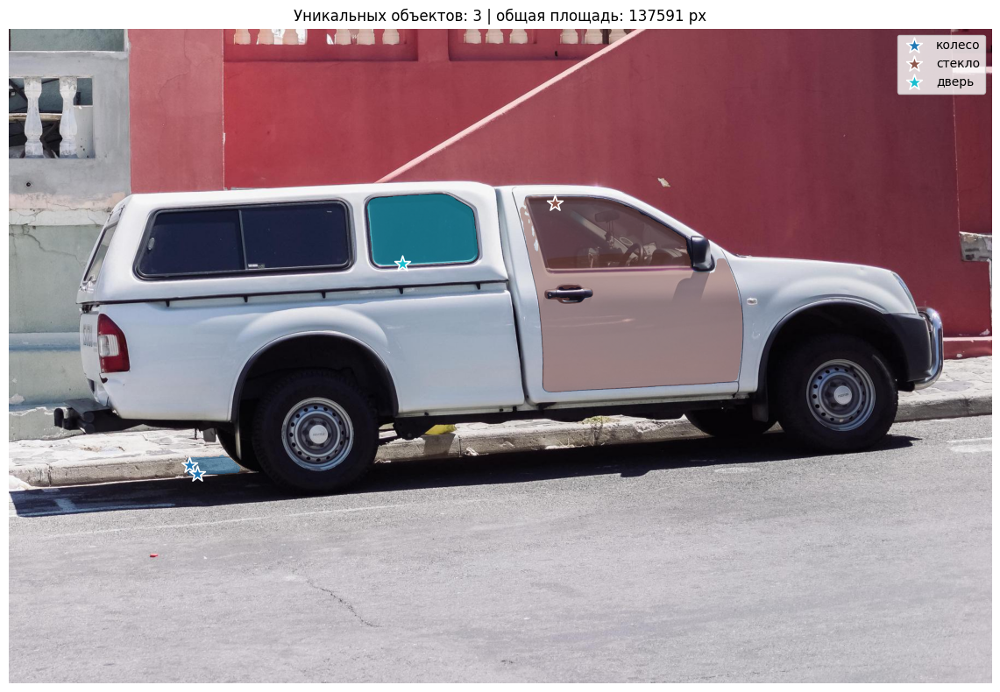

Уникальных объектов: 3
Общая площадь: 137591 px
Клик -> объект: [0, 0, 1, 2]


In [17]:
clicks = [
    ((330, 800), "колесо"),
    ((345, 815), "колесо"),
    ((1000, 320), "стекло"),
    ((720, 430), "дверь"),
]

report = collect_objects(image, clicks, dup_iou=0.7)
print("Уникальных объектов:", report["num_objects"])
print("Общая площадь:", report["total_area"], "px")
print("Клик -> объект:", report["assignment"])


### Задание 2 — анализ качества на разных типах изображений

Берём три изображения (природа, город, люди), запускаем автоматическую сегментацию, считаем число объектов и средний `predicted_iou`, строим графики.

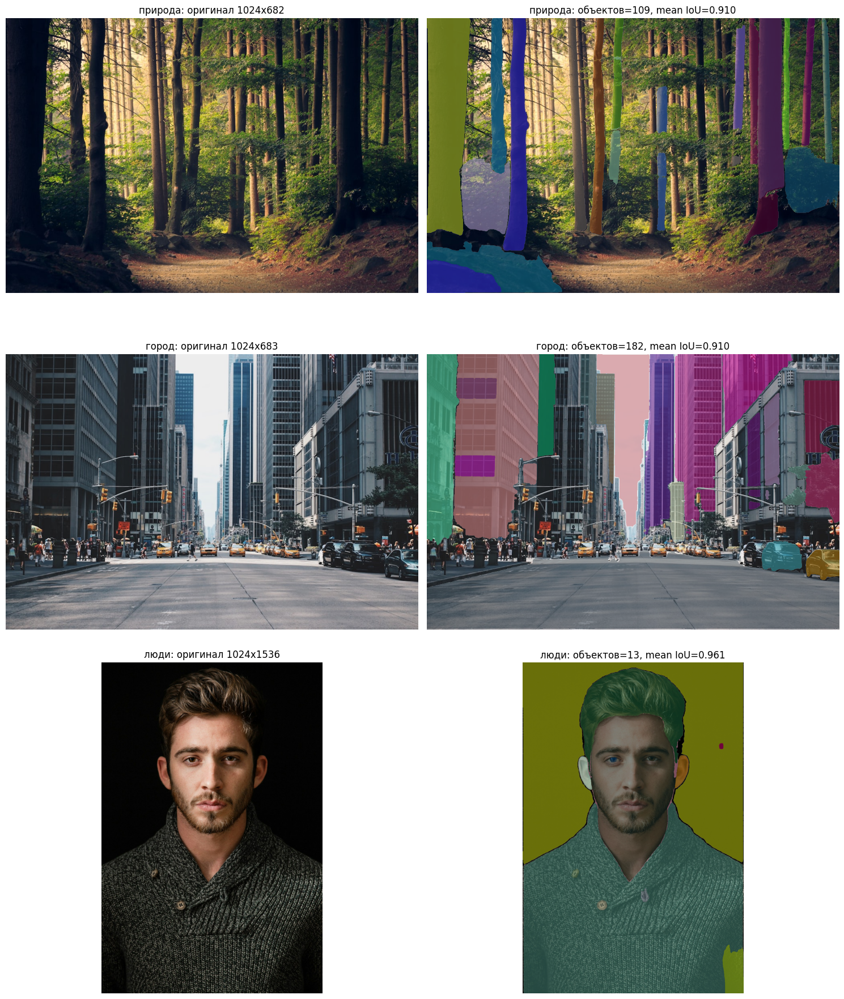

Статистика по сценам:
  природа : объектов= 109, mean IoU=0.910, mean area=3773
  город   : объектов= 182, mean IoU=0.910, mean area=3503
  люди    : объектов=  13, mean IoU=0.961, mean area=201383


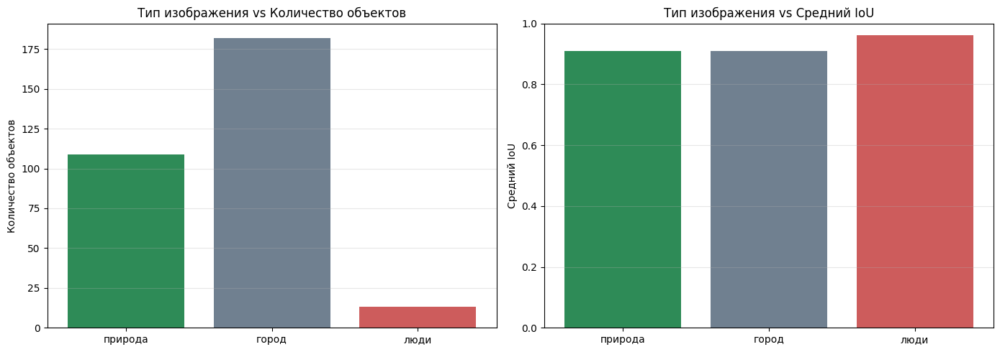

In [18]:
def fetch_rgb(url):
    resp = requests.get(url, timeout=60)
    return np.array(Image.open(io.BytesIO(resp.content)).convert("RGB"))

scenes = {
    "природа": "https://images.unsplash.com/photo-1441974231531-c6227db76b6e?auto=format&fit=crop&w=1024&q=80",
    "город":   "https://images.unsplash.com/photo-1449824913935-59a10b8d2000?auto=format&fit=crop&w=1024&q=80",
    "люди":    "https://images.unsplash.com/photo-1506794778202-cad84cf45f1d?auto=format&fit=crop&w=1024&q=80",
}

summary = []
fig, axes = plt.subplots(len(scenes), 2, figsize=(15, 6 * len(scenes)))

for i, (scene, url) in enumerate(scenes.items()):
    pic = fetch_rgb(url)

    gen = SamAutomaticMaskGenerator(
        model=sam,
        points_per_side=32,
        pred_iou_thresh=0.86,
        stability_score_thresh=0.92,
        crop_n_layers=1,
        crop_n_points_downscale_factor=2,
        min_mask_region_area=100,
    )
    masks = gen.generate(pic)

    n = len(masks)
    mean_iou = float(np.mean([m["predicted_iou"] for m in masks])) if n else 0.0
    mean_area = float(np.mean([m["area"] for m in masks])) if n else 0.0
    summary.append({"scene": scene, "n": n, "iou": mean_iou, "area": mean_area})

    axes[i, 0].imshow(pic)
    axes[i, 0].set_title(f"{scene}: оригинал {pic.shape[1]}x{pic.shape[0]}")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(pic)
    show_anns(masks, axes[i, 1])
    axes[i, 1].set_title(f"{scene}: объектов={n}, mean IoU={mean_iou:.3f}")
    axes[i, 1].axis("off")

plt.tight_layout()
plt.show()

print("Статистика по сценам:")
for row in summary:
    print(f"  {row['scene']:8s}: объектов={row['n']:4d}, "
          f"mean IoU={row['iou']:.3f}, mean area={row['area']:.0f}")

labels = [r["scene"] for r in summary]
counts = [r["n"] for r in summary]
ious = [r["iou"] for r in summary]

fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].bar(labels, counts, color=["seagreen", "slategray", "indianred"])
ax[0].set_title("Тип изображения vs Количество объектов")
ax[0].set_ylabel("Количество объектов")
ax[0].grid(axis="y", alpha=0.3)

ax[1].bar(labels, ious, color=["seagreen", "slategray", "indianred"])
ax[1].set_title("Тип изображения vs Средний IoU")
ax[1].set_ylabel("Средний IoU")
ax[1].set_ylim(0, 1)
ax[1].grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()


Числа из прогона: природа — 109 объектов (mean IoU 0.91), город — 182 объекта (mean IoU 0.91), люди — 13 объектов (mean IoU 0.96).

Больше всего масок SAM нашёл на городской сцене — там много мелких отдельных областей (окна, машины, фасады), и средняя площадь маски самая маленькая: сегментация получается дробной. На природе объектов меньше, а среднее качество такое же, как у города. Заметно лучше всего модель отработала на сцене с людьми — всего 13 крупных масок, самая большая средняя площадь и самый высокий средний IoU (0.96): крупные, хорошо отделимые объекты выделяются увереннее.

Вывод: SAM надёжнее на крупных и хорошо отделимых объектах, а на насыщенных сценах с множеством мелких деталей выдаёт больше масок, но дробных и менее стабильных по качеству.

### Задание 3 (трек Creative) — портретный режим

По одному клику выделяем главный объект, а фон размываем гауссовым фильтром — получается эффект размытия фона как в портретном режиме камеры.

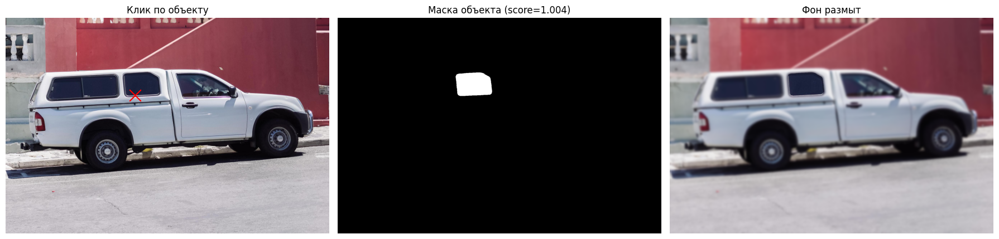

Площадь объекта: 23453 px | score: 1.004


In [19]:
def portrait_mode(img, click_xy, blur_strength=31, darken_bg=False):
    predictor.set_image(img)

    masks, scores, _ = predictor.predict(
        point_coords=np.array([click_xy]),
        point_labels=np.array([1]),
        multimask_output=True,
    )
    subject = masks[int(np.argmax(scores))]
    best_score = float(np.max(scores))

    k = blur_strength if blur_strength % 2 == 1 else blur_strength + 1
    background = cv2.GaussianBlur(img, (k, k), 0)
    if darken_bg:
        background = (background * 0.6).astype(img.dtype)

    out = background.copy()
    out[subject] = img[subject]

    fig, ax = plt.subplots(1, 3, figsize=(18, 6))
    ax[0].imshow(img)
    ax[0].scatter(*click_xy, c="red", s=220, marker="x")
    ax[0].set_title("Клик по объекту")
    ax[0].axis("off")

    ax[1].imshow(subject, cmap="gray")
    ax[1].set_title(f"Маска объекта (score={best_score:.3f})")
    ax[1].axis("off")

    ax[2].imshow(out)
    ax[2].set_title("Фон размыт")
    ax[2].axis("off")
    plt.tight_layout()
    plt.show()

    return out, subject, best_score


result_img, subject_mask, sc = portrait_mode(image, [720, 430], blur_strength=35)
print("Площадь объекта:", int(subject_mask.sum()), "px | score:", round(sc, 3))


SAM по одному клику находит главный объект, после чего достаточно размыть всё, кроме его маски. Эффект выглядит убедительно, если точка стоит внутри объекта и маска аккуратная; на сложных границах (волосы, тонкие детали) края бывают неровными — тогда помогает уточнение маски дополнительными точками или боксом.